# Interacting with OpenAIS API

The OpenAIS database has data that is published via an OGC compliant API using Pg-FeatureServ. This API meets a bunch of OGC standards and so can be used with the OpenGeospatial Web Service Library [owslib](https://owslib.readthedocs.io/en/latest/usage.html#ogc-api) to pull ship movement data and other spatial features. This notebook has the steps required to do some basic plotting on a region and ships and demonstrates how to do OGC compliant API queries with filters and bounding boxes.

Some reading:
* OWS Lib: https://owslib.readthedocs.io/en/latest/
* OGC API: https://ogcapi.ogc.org/
* Common Query Language: https://portal.ogc.org/files/96288
* PG Featureserv: https://access.crunchydata.com/documentation/pg_featureserv/1.2.0/introduction/
  

In [1]:
import requests
import urllib
import json
import random 
import pandas as pd
import geopandas as gpd
from owslib.ogcapi.features import Features
import plotly.express as px
import datetime

The URL to use would depend on your specific setup. It should reference the externally available hostname/IP address of the machine running the PG-Featureserv container. If everything is running locally on your machine it should be localhost:9000 as long as your jupyter notebook is not running inside a Docker container (that would consider localhost to reference the container and not the hostmachine).  

In [2]:
url = 'http://10.0.0.91:9000'
url = 'http://10.152.56.154:9000'

healthcheck_path = '/functions/postgisftw.health_check/items.json'
ship_path = '/collections/postgisftw.ship/items.json'

### Check DB Health

There is a health check "function" published on the API. In PgFeatureserv Functions are different from Collections and are not accesible via OWSLib. Do fetch information via a function you would need to do a non OGC-API query to the API. This is done by a bog-standard REST query.  

This API endpoint checks whether the latest data in a view/table is within a certain time window. If the data falls outside this window then it indicates that DB inserts or DB scheduled functions are not happening as expected.

In [3]:
health_check = requests.get(urllib.parse.urljoin(url,healthcheck_path))
health_json=health_check.json()
all_is_healthy = all(x.get('source_is_okay') == True for x in health_json)
if all_is_healthy != True:
    print('==========')
    print('Unhealthy Views/Tables:')
    for service in health_json:
        if service.get('source_is_okay') != True:
            print('==========')
            print(service)
else:
    print('==========')
    print('Everything up to date.')

Unhealthy Views/Tables:
{'_routing_key': None, 'data_source': 'ais.vessel_details_cagg', 'good_interval': {'Microseconds': 3600000000, 'Days': 0, 'Months': 0, 'Status': 2}, 'last_event_time': '2024-04-24 09:14:04+00', 'last_insert_or_bucket_time': '2024-04-24 00:00:00+00', 'source_is_okay': False}
{'_routing_key': None, 'data_source': 'ais.trajectories', 'good_interval': {'Microseconds': 86400000000, 'Days': 0, 'Months': 0, 'Status': 2}, 'last_event_time': '2024-04-23 00:00:00+00', 'last_insert_or_bucket_time': None, 'source_is_okay': False}
{'_routing_key': None, 'data_source': 'ais.vessel_density_agg', 'good_interval': {'Microseconds': 172800000000, 'Days': 0, 'Months': 0, 'Status': 2}, 'last_event_time': '2024-04-22 00:00:00+00', 'last_insert_or_bucket_time': '2024-04-22 00:00:00+00', 'source_is_okay': False}


## Steps to plotting ships
There are several logical steps for doing API requests from the DB to plot a web map of ships, and then more information on a specific ship.

* Plot *most recent position* for ships that fall within a region and time period. This end-point fetches the most recent position report for vessels. The most recent position, for a historical time window, can be selected by using CQL filters. 
    * **API EndPoint: postgisftw.latest_positions**
* Find a specific ship given it's MMSI or Callsign or some other parameter. CQL can be used to do "like" filters for fuzzy string matches
    * **API EndPoint: postgisftw.ships**  
* Fetch the trajectory associated with the vessel. 
    * API EndPoint: postgisftw.traj 
* Fetch the points associated with it's history
    * API EndPoint: postgisftw.positions
* Fetch some baselayers:
    * API EndPoint: geom
    * API EndPoint: heatmap 
* Plot Results
    * Plot the trajectory on the map
    * Plot the points on the map
    * Plot an time vs COG,SOG,HDG coloured by Nav Status

### Find Points in time/space

Find all vessels that fall within a time and space window. Space is handled by a bbox lat/lon envelope and the time window is handled by having a filter on the "time_bucket" parameter.

In [4]:
w = Features(url) 
api = w.api()

In [5]:
# Space:
bbox = (0,60,10,70) 
time_window = (datetime.datetime.now() - datetime.timedelta(days=1)).isoformat()

<Axes: >

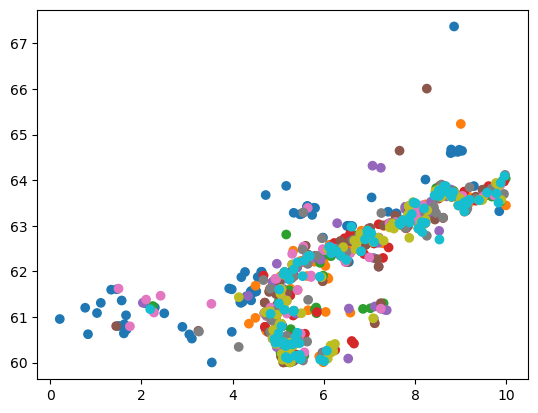

In [6]:
pos_query = w.collection_items('postgisftw.latest_positions', bbox=bbox, filter = f"time_bucket > '{time_window}'")
pos_gdf = gpd.GeoDataFrame.from_features(pos_query)
pos_gdf.plot(column='mmsi')

In [7]:
pos_gdf

,geometry,callsign,cog,draught,flag,imo,mmsi,name,nav_description,nav_status,sog,sub_type,time_bucket,type,type_and_cargo
0,POINT (4.91495 60.59891),None,182.5,NaN,None,None,106000126,None,None,None,2.3,None,2024-04-24 13:30:00+00,None,None
1,POINT (5.63508 63.37222),None,336.1,NaN,None,None,109050876,None,None,None,4.4,None,2024-04-24 13:30:00+00,None,None
2,POINT (5.64480 63.38473),None,291.8,NaN,None,None,109050880,None,None,None,0.6,None,2024-04-24 13:30:00+00,None,None
3,POINT (5.64500 63.42430),None,28.6,NaN,None,None,109050881,None,None,None,1.6,None,2024-04-24 13:30:00+00,None,None
4,POINT (5.64225 63.37783),None,334.0,NaN,None,None,109050882,None,None,None,1.6,None,2024-04-24 13:30:00+00,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,POINT (5.33979 61.13572),LG9760,360.0,0.0,Norway,0,257968600,FOSNA ODIN,None,0,0.0,None,2024-04-24 13:30:00+00,Towing,31
996,POINT (9.58217 63.72705),None,128.5,NaN,Norway,None,257968700,None,None,None,0.0,None,2024-04-24 13:30:00+00,None,None
997,POINT (5.42029 60.65287),LG3442,357.8,0.0,Norway,0,257970700,VESTVAAG,Moored,5,0.1,All Types,2024-04-24 13:30:00+00,Other,99
998,POINT (9.79097 63.70805),LDYV,289.7,2.4,Norway,6902808,257971000,TORVANG,Moored,5,0.0,All Types,2024-04-24 13:30:00+00,Cargo,79


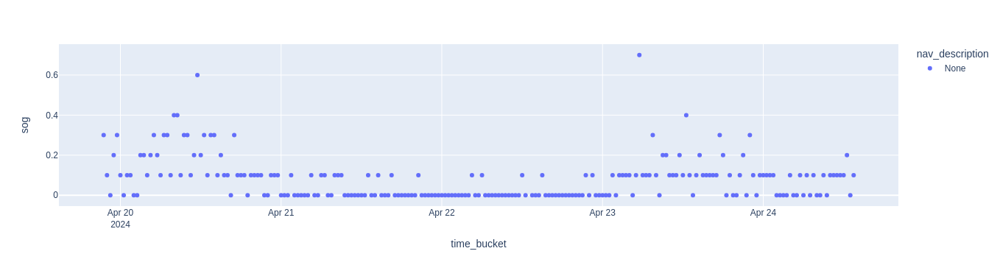

In [8]:
random_ship = pos_gdf.sample(1) 
random_mmsi = random_ship['mmsi'].values[0]

single_ship_pos_query = w.collection_items('postgisftw.positions', filter = f"mmsi = '{random_mmsi}'")
single_ship_pos_gdf = gpd.GeoDataFrame.from_features(single_ship_pos_query)
# single_ship_pos_gdf

fig = px.scatter(single_ship_pos_gdf,  x="time_bucket", y="sog",color = 'nav_description') 
fig.show()

In [9]:
single_ship_pos_gdf

,geometry,callsign,cog,draught,flag,imo,mmsi,name,nav_description,nav_status,sog,sub_type,time_bucket,type,type_and_cargo
0,POINT (5.11366 60.00082),None,315.8,None,Norway,None,257178900,None,None,None,0.1,None,2024-04-24 13:30:00+00,None,None
1,POINT (5.11365 60.00080),None,239.3,None,Norway,None,257178900,None,None,None,0.0,None,2024-04-24 13:00:00+00,None,None
2,POINT (5.11364 60.00083),None,315.7,None,Norway,None,257178900,None,None,None,0.2,None,2024-04-24 12:30:00+00,None,None
3,POINT (5.11361 60.00082),None,265.0,None,Norway,None,257178900,None,None,None,0.1,None,2024-04-24 12:00:00+00,None,None
4,POINT (5.11365 60.00083),None,305.7,None,Norway,None,257178900,None,None,None,0.1,None,2024-04-24 11:30:00+00,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
219,POINT (5.11367 60.00081),None,71.8,None,Norway,None,257178900,None,None,None,0.3,None,2024-04-19 23:30:00+00,None,None
220,POINT (5.11364 60.00081),None,290.8,None,Norway,None,257178900,None,None,None,0.2,None,2024-04-19 23:00:00+00,None,None
221,POINT (5.11365 60.00081),None,160.7,None,Norway,None,257178900,None,None,None,0.0,None,2024-04-19 22:30:00+00,None,None
222,POINT (5.11369 60.00082),None,160.7,None,Norway,None,257178900,None,None,None,0.1,None,2024-04-19 22:00:00+00,None,None


### Find Info on Specific Ship

More information is needed on a ship. Things like it's trajectory over the last day, it's callsign etc. 

#### Trajectory

<Axes: >

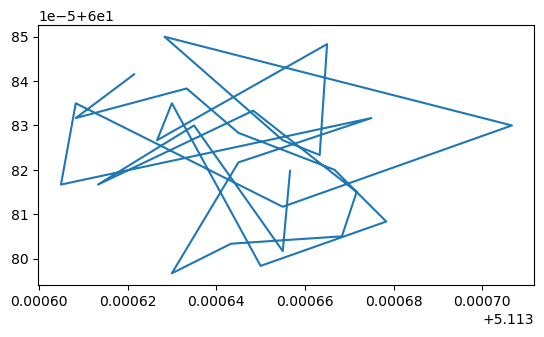

In [10]:
traj = w.collection('postgisftw.traj')
traj_query = w.collection_items('postgisftw.traj', filter = f"mmsi = '{random_mmsi}' AND date >= '{time_window}'")
traj_gdf = gpd.GeoDataFrame.from_features(traj_query)
traj_gdf.plot()

#### Ship Details

In [11]:
ships = w.collection('postgisftw.ship')
ship_query = w.collection_items('postgisftw.ship', filter = f"mmsi = '{random_mmsi}'")
ships_gdf = gpd.GeoDataFrame.from_features(ship_query)
ships_gdf

""


## Baselayers

#### Heatmaps

<Axes: >

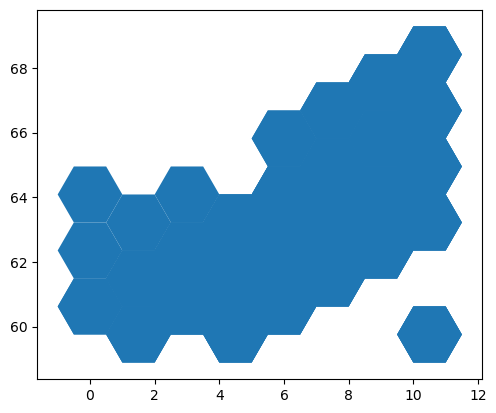

In [14]:
heat = w.collection('postgisftw.heatmap_track_count')
heat_query = w.collection_items('postgisftw.heatmap_track_count', bbox=bbox)
heat_gdf = gpd.GeoDataFrame.from_features(heat_query)
heat_gdf.plot() 

#### Geometry of Interest
Various geometery definitions from MarineRegions were taken and aggregated in the DB to create a layer similar to a municipal boundaries definition. This would allow "context" to be added to various regions of the ocean. It quickly allows a user to determine whether a vessel is in an EEZ, river, 12 NM or open ocean zone. 

<Axes: >

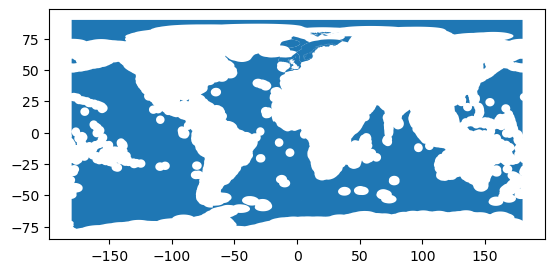

In [12]:
geom = w.collection('postgisftw.maritime_boundaries')
geom_query = w.collection_items('postgisftw.maritime_boundaries', bbox=bbox)
geom_gdf = gpd.GeoDataFrame.from_features(geom_query)
geom_gdf.plot() 

# Putting it all together

This is put together using Leafmap, a very nifty python tool for plotting maps.

https://leafmap.org/notebooks/

In [28]:
style = { "stroke": False,
         "color": "#ff0000", 
         "weight": 1, 
         "opacity": 1, 
         "fill": True, 
         "fillColor": "#ffffff", 
         "fillOpacity": 1.0, 
         "dashArray": "9", 
         "clickable": True, }

In [45]:
import leafmap.foliumap as leafmap

poly_style = {
        'weight': 2,
        'opacity': 1,
        'color': 'white',
        'dashArray': '3',
        'fillOpacity': 0.5
    };

m = leafmap.Map(center=[60, 5], zoom=2)
m.add_data(heat_gdf.to_json(), column="track_count_all", scheme="Quantiles", cmap="viridis", legend_title="Track Count", style = style)
m.add_gdf(pos_gdf, layer_name="Latest Ship Positions") 
# m.add_gdf(single_ship_pos_gdf, layer_name="Ship Positions")
m.add_gdf(traj_gdf, layer_name="Ship Trajectory")
m.add_gdf(geom_gdf, layer_name="MarineRegions") 
m